<h1>Classification - Decision Tree<h1>

</h6>By Navneeth Krishnan 
           </h6>

<blockquote>Implementing the Decision Tree algorithm on a Loan Repayment dataset. Implementing a tree without tuning and then pruning the tree with optimization of Max Depth</blockquote>

<h3> Exploratory Data Analysis and Train Test Split</h3>

In [1]:
import pandas as pd#Importing required packages 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt       
%matplotlib inline
plt.style.use('ggplot')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
#Loading the Data into the Notebook
df = pd.read_csv('loan_data.csv')
df

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.10,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.70,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.60,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.20,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.50,0,1,0,0
5,1,credit_card,0.0788,125.13,11.904968,16.98,727,6120.041667,50807,51.00,0,0,0,0
6,1,debt_consolidation,0.1496,194.02,10.714418,4.00,667,3180.041667,3839,76.80,0,0,1,1
7,1,all_other,0.1114,131.22,11.002100,11.08,722,5116.000000,24220,68.60,0,0,0,1
8,1,home_improvement,0.1134,87.19,11.407565,17.25,682,3989.000000,69909,51.10,1,0,0,0
9,1,debt_consolidation,0.1221,84.12,10.203592,10.00,707,2730.041667,5630,23.00,1,0,0,0


<h6>Dataset Details</h6>

In [3]:
#Displaying the Columns 
df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

In [4]:
#Count of Columns
print(len(df.columns))

14


In [5]:
#Count for each Coulmn
df.count()

credit.policy        9578
purpose              9578
int.rate             9578
installment          9578
log.annual.inc       9578
dti                  9578
fico                 9578
days.with.cr.line    9578
revol.bal            9578
revol.util           9578
inq.last.6mths       9578
delinq.2yrs          9578
pub.rec              9578
not.fully.paid       9578
dtype: int64

<h6>Heatmap Showing Nulls,NaN(s) and Zeros</h6>

<AxesSubplot:>

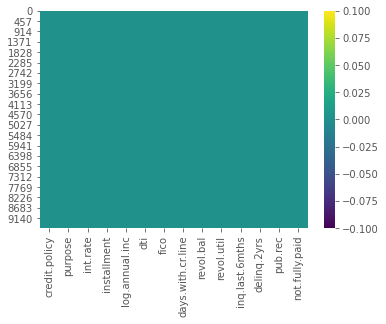

In [6]:
#Heatmap showing the Nulls
sns.heatmap(df.isnull(),cmap='viridis',fmt='.2g')

<AxesSubplot:>

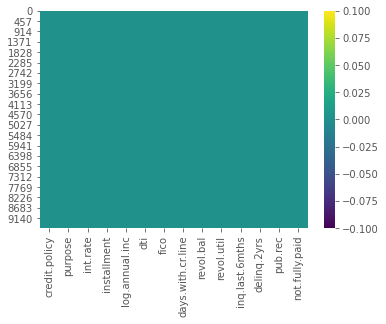

In [7]:
#Heatmap showing the NaN(s)
sns.heatmap(df.isna(),cmap='viridis',fmt='.2g')

<AxesSubplot:>

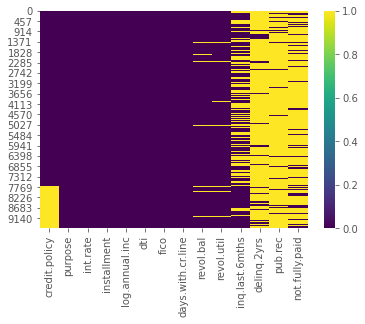

In [8]:
#Heatmap showing the Zeros
sns.heatmap(df.isin([0]),cmap='viridis',fmt='.2g')

In [9]:
df_copy = df

In [10]:
df_copy.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [11]:
df_copy['purpose']= df_copy['purpose'].astype('category')

In [12]:
#Encoding the 'Purpose' column with dummies as it is a Categorical Variable
df_copy = pd.get_dummies(df_copy,columns = ['purpose'])

df_copy

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_all_other,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.10,0,0,0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.70,0,0,0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.60,1,0,0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.20,1,0,0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.50,0,1,0,0,0,1,0,0,0,0,0
5,1,0.0788,125.13,11.904968,16.98,727,6120.041667,50807,51.00,0,0,0,0,0,1,0,0,0,0,0
6,1,0.1496,194.02,10.714418,4.00,667,3180.041667,3839,76.80,0,0,1,1,0,0,1,0,0,0,0
7,1,0.1114,131.22,11.002100,11.08,722,5116.000000,24220,68.60,0,0,0,1,1,0,0,0,0,0,0
8,1,0.1134,87.19,11.407565,17.25,682,3989.000000,69909,51.10,1,0,0,0,0,0,0,0,1,0,0
9,1,0.1221,84.12,10.203592,10.00,707,2730.041667,5630,23.00,1,0,0,0,0,0,1,0,0,0,0


,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_all_other,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
credit.policy,1.000000,-0.294089,0.058770,0.034906,-0.090901,0.348319,0.099026,-0.187518,-0.104095,-0.535511,-0.076318,-0.054243,-0.158119,-0.025412,0.003216,0.020193,-0.031346,0.006036,0.024281,-0.003511
int.rate,-0.294089,1.000000,0.276140,0.056383,0.220006,-0.714821,-0.124022,0.092527,0.464837,0.202780,0.156079,0.098162,0.159552,-0.124000,-0.042109,0.123607,-0.019618,-0.050697,-0.068978,0.151247
installment,0.058770,0.276140,1.000000,0.448102,0.050202,0.086039,0.183297,0.233625,0.081356,-0.010419,-0.004368,-0.032760,0.049955,-0.203103,0.000774,0.161658,-0.094510,0.023024,-0.079836,0.145654
log.annual.inc,0.034906,0.056383,0.448102,1.000000,-0.054065,0.114576,0.336896,0.372140,0.054881,0.029171,0.029203,0.016506,-0.033439,-0.080077,0.072942,-0.026214,-0.119799,0.116375,-0.031020,0.091540
dti,-0.090901,0.220006,0.050202,-0.054065,1.000000,-0.241191,0.060101,0.188748,0.337109,0.029189,-0.021792,0.006209,0.037362,-0.125825,0.084476,0.179149,-0.035325,-0.092788,-0.077719,-0.069245
fico,0.348319,-0.714821,0.086039,0.114576,-0.241191,1.000000,0.263880,-0.015553,-0.541289,-0.185293,-0.216340,-0.147592,-0.149666,0.067184,-0.012512,-0.154132,-0.013012,0.097474,0.067129,0.063292
days.with.cr.line,0.099026,-0.124022,0.183297,0.336896,0.060101,0.263880,1.000000,0.229344,-0.024239,-0.041736,0.081374,0.071826,-0.029237,-0.056574,0.046220,-0.009318,-0.042621,0.068087,-0.020561,0.034883
revol.bal,-0.187518,0.092527,0.233625,0.372140,0.188748,-0.015553,0.229344,1.000000,0.203779,0.022394,-0.033243,-0.031010,0.053699,-0.067728,0.072316,0.005785,-0.034743,0.003258,-0.062395,0.083069
revol.util,-0.104095,0.464837,0.081356,0.054881,0.337109,-0.541289,-0.024239,0.203779,1.000000,-0.013880,-0.042740,0.066717,0.082088,-0.138535,0.091321,0.211869,-0.053128,-0.114449,-0.108079,-0.060962
inq.last.6mths,-0.535511,0.202780,-0.010419,0.029171,0.029189,-0.185293,-0.041736,0.022394,-0.013880,1.000000,0.021245,0.072673,0.149452,0.017795,-0.033640,-0.044240,0.024243,0.043827,-0.001445,0.042567


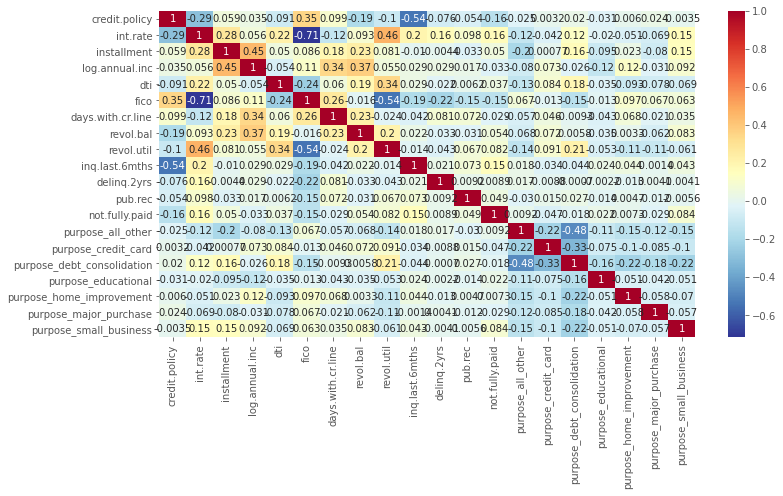

In [13]:
#Heatmap, describing various inter-dependancies between the Features 
#Also, performing a Correlation between the Features
plt.figure(figsize=(12,6))
c= df_copy.corr()
sns.heatmap(c,cmap='RdYlBu_r',annot=True)
c

<h6>Test Train Splitting</h6>

In [14]:
#Splitting the data in Training and Testing samples
#Importing Train-Test Split
from sklearn.model_selection import train_test_split

In [15]:
#Splitting the Features and Outcomes
#X represents the Features and Y represents the Outcomes
X = df_copy.drop(columns=['not.fully.paid'],axis=1)
Y = df_copy['not.fully.paid']

In [16]:
#Splitting the data into Stratified Training and Testing Data 
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=42,stratify=Y)

<h5>Implementing the Decision Tree Classifier</h5>

In [17]:
#Importing the Required Libraries 
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [18]:
#Building the Decision Tree Model 
clf = DecisionTreeClassifier()
clf = clf.fit(X_train,Y_train)

In [19]:
#Making Prediction on the Test Values
Y_pred = clf.predict(X_test)

In [20]:
#Printing the Confusion Matrix
pd.crosstab(Y_test,Y_pred,rownames=['True'],colnames=['Predicted'],margins=True)

Predicted,0,1,All
True,,,
0,2043,371,2414
1,356,104,460
All,2399,475,2874


In [21]:
#Printing the Accuracy
print("Accuracy %:",metrics.accuracy_score(Y_test,Y_pred)*100)

Accuracy %: 74.70424495476688


In [22]:
#Printing the Classification Report
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      2414
           1       0.22      0.23      0.22       460

    accuracy                           0.75      2874
   macro avg       0.54      0.54      0.54      2874
weighted avg       0.75      0.75      0.75      2874



<h6>Printing the Tree before Pruning</h6>

In [23]:
#Importing the required Libs
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
import os.path
from sklearn import tree

In [24]:
X_train.columns
feature_cols = ['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti',
       'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'purpose_all_other',
       'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_educational', 'purpose_home_improvement',
       'purpose_major_purchase', 'purpose_small_business']

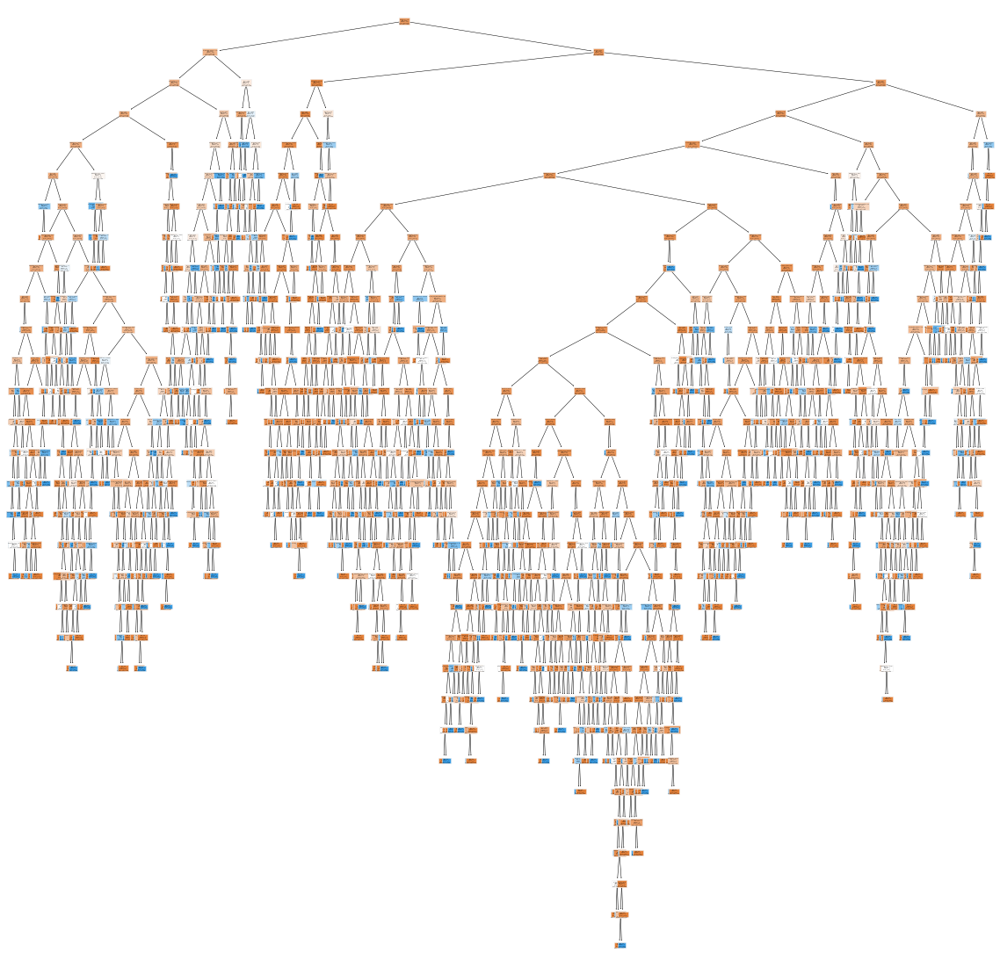

In [25]:
plt.figure(figsize=(20,20))
classes = ['not.fully.paid','fully.paid']
tree.plot_tree(clf,feature_names=feature_cols,class_names=classes,filled=True)
plt.show()

<h6>Pruning the Tree</h6>

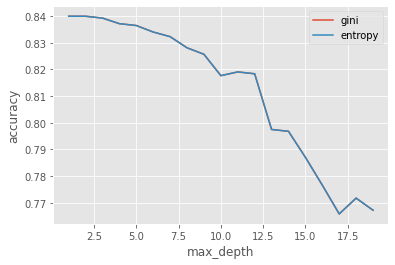

In [26]:
max_depth = []
acc_gini = []
acc_entropy = []
for i in range(1,20):
    #Claculating the Accuracy for 'Gini' Criterion
    dtr = DecisionTreeClassifier(criterion='gini',max_depth=i)
    dtr.fit(X_train,Y_train)
    Y_predPR = dtr.predict(X_test)
    acc_gini.append(metrics.accuracy_score(Y_test,Y_predPR))
    
    #Claculating the Accuracy for 'Entropy' Criterion
    dtr = DecisionTreeClassifier(criterion='entropy',max_depth=i)
    dtr.fit(X_train,Y_train)
    Y_predPR = dtr.predict(X_test)
    acc_entropy.append(metrics.accuracy_score(Y_test,Y_predPR))
    
    max_depth.append(i)
    
df_pr = pd.DataFrame({'acc_gini':pd.Series(acc_gini),'acc_entropy':pd.Series(acc_entropy),'max_depth':pd.Series(max_depth)}) 
plt.plot('max_depth','acc_gini',data=df_pr,label='gini')
plt.plot('max_depth','acc_gini',data=df_pr,label='entropy')
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.grid(True)
plt.legend()

In [27]:
df_pr.head(10)

,acc_gini,acc_entropy,max_depth
0,0.839944,0.839944,1
1,0.839944,0.839944,2
2,0.839248,0.839944,3
3,0.837161,0.838900,4
4,0.836465,0.837509,5
5,0.834029,0.834377,6
6,0.832289,0.829158,7
7,0.828114,0.823939,8
8,0.825678,0.818372,9
9,0.817676,0.808629,10


In [28]:
#Building the Decision Tree Model for Max_Depth = 3 as that brings the Maximum Accuracy
clf = DecisionTreeClassifier(max_depth=3,criterion='entropy')
clf = clf.fit(X_train,Y_train)

In [29]:
Y_pred = clf.predict(X_test)

In [30]:
#Printing the Confusion Matrix
pd.crosstab(Y_test,Y_pred,rownames=['True'],colnames=['Predicted'],margins=True)

Predicted,0,All
True,,
0,2414,2414
1,460,460
All,2874,2874


In [31]:
#Printing the Accuracy
print("Accuracy %:",metrics.accuracy_score(Y_test,Y_pred)*100)

Accuracy %: 83.99443284620737


In [32]:
#Printing the Classification Report 
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2414
           1       0.00      0.00      0.00       460

    accuracy                           0.84      2874
   macro avg       0.42      0.50      0.46      2874
weighted avg       0.71      0.84      0.77      2874



c:\users\navneeth k\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\navneeth k\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\navneeth k\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

In [33]:
dt_data = StringIO()

export_graphviz(clf,out_file=dt_data,
               filled=True,rounded=True,
               special_characters=True,
               feature_names=feature_cols,class_names=['0','1'])

In [34]:
graph = pydotplus.graph_from_dot_data(dt_data.getvalue())

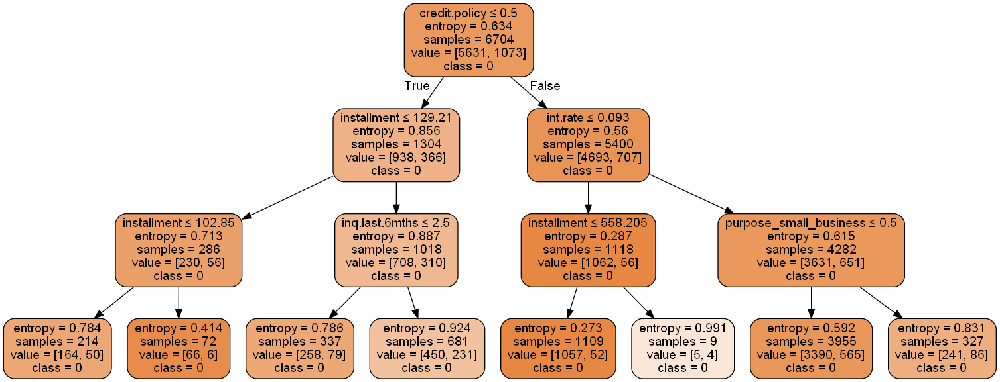

In [35]:
graph.write_png('tree_pruned.png')
Image(graph.create_png())

<h6>Stratified K Fold Accuracy</h6>

In [36]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score

In [37]:
#Building k-Fold Stratified 
kf = StratifiedKFold(n_splits=10,shuffle=True,random_state=42)
c = 1
for train_index, test_index in kf.split(X_train,Y_train):
    print(f'Fold:{c}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    c+=1

Fold:1, Train set: 6033, Test set:671
Fold:2, Train set: 6033, Test set:671
Fold:3, Train set: 6033, Test set:671
Fold:4, Train set: 6033, Test set:671
Fold:5, Train set: 6034, Test set:670
Fold:6, Train set: 6034, Test set:670
Fold:7, Train set: 6034, Test set:670
Fold:8, Train set: 6034, Test set:670
Fold:9, Train set: 6034, Test set:670
Fold:10, Train set: 6034, Test set:670


In [38]:
#Accuracies for the Stratified Cross Validation Accuracy
score = cross_val_score(tree.DecisionTreeClassifier(random_state= 42), X_train, Y_train, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.2f}".format(score.mean())}')

Scores for each fold are: [0.75111773 0.74813711 0.74217586 0.75707899 0.70447761 0.72835821
 0.72985075 0.73134328 0.74328358 0.7358209 ]
Average score: 0.74


In [39]:
#Printing the Accuracies for the various Max_Depths
max_depth = [1,2,3,4,5,6,7,8,9,10]

for val in max_depth:
    score = cross_val_score(tree.DecisionTreeClassifier(max_depth= val, random_state= 42), X_train, Y_train, 
                            cv= kf, scoring="accuracy")
    print(f'Average score({val}): {"{:.5f}".format(score.mean()*100)}')

Average score(1): 83.99466
Average score(2): 83.99466
Average score(3): 83.81551
Average score(4): 83.69631
Average score(5): 83.39798
Average score(6): 83.11458
Average score(7): 82.87593
Average score(8): 82.30925
Average score(9): 81.04133
Average score(10): 80.65342


<h6>Final Decision Tree</h6>

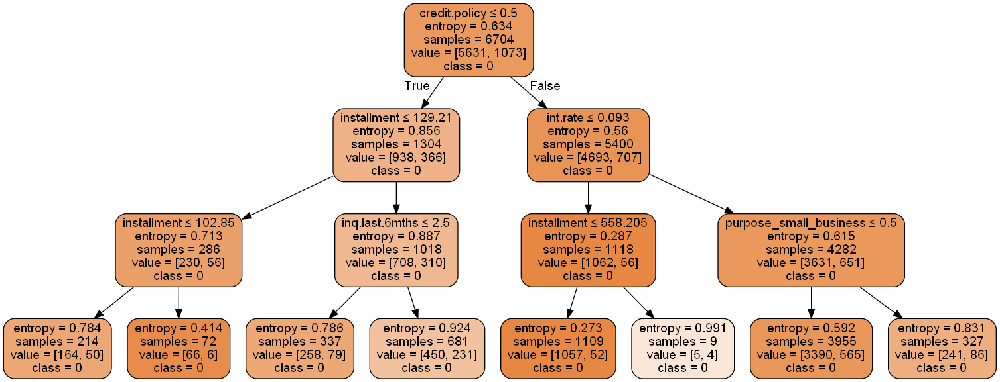

In [40]:
graph.write_png('tree_pruned.png')
Image(graph.create_png())